In [1]:
import datetime
import pandas as pd
import numpy as np
import scipy.stats as ss
import itertools
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.animation as animation
from IPython.display import Image, display, HTML
import folium 
%matplotlib inline
import warnings 
import pmdarima as pm
import statsmodels.api as sm
import statsmodels.tsa.seasonal as sts
from statsmodels.tsa.stattools import adfuller, kpss
from statsmodels.stats.diagnostic import acorr_ljungbox
import statsmodels.graphics.tsaplots as splt
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.statespace.sarimax import SARIMAX


## Jordan Lake, North Carolina

In [2]:
lat = 35.7809955
lon = -79.017105
targ_lat = [35.676263, 35.885728]
targ_lon = [-79.07959, -78.95462]
m = folium.Map(location=[lat, lon], zoom_start=11)
folium.Marker(location=[lat, lon], popup="point of interest").add_to(m)
display(m)

## Read data already downloaded from CYAN project from parquet file

In [3]:
%%time
URL = './data/L3B/'
cols = ['clat','clon','north','south','west','east','date','CI_cyano']

f = 'L3B_CYAN_DAILY_JORDAN.parquet'
df = pd.read_parquet(URL + f, columns=cols)

df.shape

CPU times: user 73.6 ms, sys: 39.5 ms, total: 113 ms
Wall time: 75.2 ms


(336903, 8)

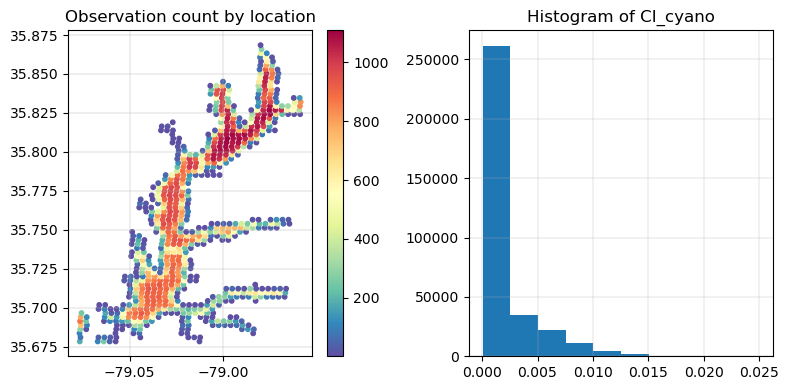

In [4]:
# quick check on the data
df_loc = df.groupby(['clat','clon']).CI_cyano.count().reset_index()
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(8,4))
scat = ax1.scatter(df_loc.clon, df_loc.clat, c=df_loc.CI_cyano, cmap='Spectral_r', s=10)
cbar = fig.colorbar(scat, ax=ax1)
ax1.set_title("Observation count by location", fontsize=12)
ax1.grid(linewidth=0.3, linestyle='-' )

ax2.hist(df.CI_cyano)
ax2.set_title('Histogram of CI_cyano')
ax2.grid(linewidth=0.25)
plt.tight_layout();

## Prepare data for analysis

In [5]:
# breakdown date column to year, month, day
df['date'] = pd.to_datetime(df['date'])
df['Year'] = df['date'].dt.year
df['Month'] = df['date'].dt.month
df['Day'] = df['date'].dt.day

# categorize CI_cyano values to high, medium, low
hab_high = 0.016
hab_med = 0.001

df['HAB'] = np.where(df.CI_cyano.values >= hab_high,'high',
                         np.where(df.CI_cyano.values >= hab_med, 'med', 'low'))
df['HAB_HIGH'] = (df.HAB == 'high')*1
df['HAB_MEDIUM'] = (df.HAB == 'med')*1
df['HAB_HIGH_MED'] = df['HAB_HIGH'] + df['HAB_MEDIUM']


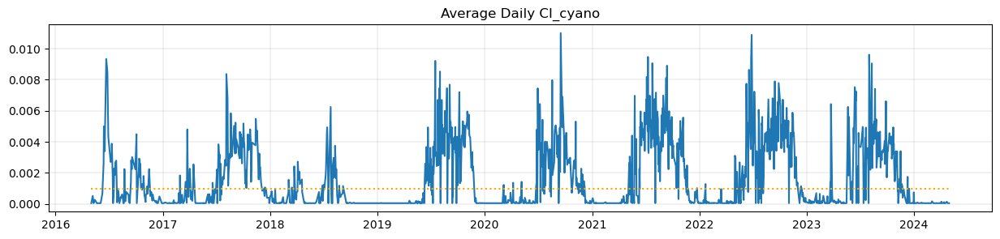

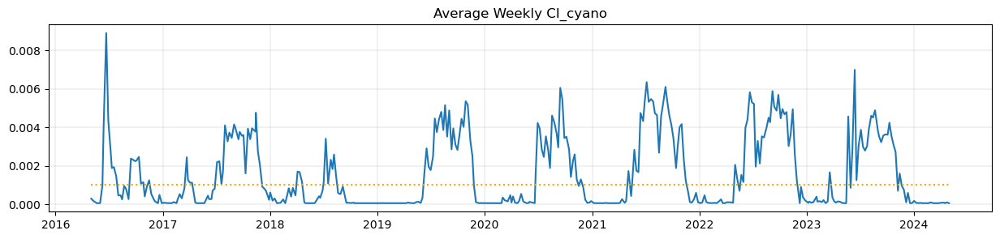

In [6]:
# aggreate data to daily averages
df_daily = df.groupby('date').agg(CI_cyano=('CI_cyano','mean'),
                                      nobs=('clat','count'),
                                      hab_high=('HAB_HIGH','sum'),
                                      hab_medium=('HAB_MEDIUM','sum'),
                                      hab_high_med=('HAB_HIGH_MED','sum')).reset_index()

df_daily['month'] = df_daily.date.dt.month
df_daily['week'] = df_daily.date.dt.isocalendar().week
df_daily['year'] = df_daily.date.dt.isocalendar().year

# aggreate data to weekly averages
df_weekly = df_daily.groupby(['year','week']).agg(date=('date','min'), CI_cyano=('CI_cyano','mean')).reset_index()
df_weekly = df_weekly.sort_values(by='date')

def plot_dt(x, y, title, hab_high = 0.016, hab_med = 0.001):
    plt.figure(figsize=(15, 3))
    plt.plot(x, y)
    if y.max() >= hab_med:
        plt.hlines(y=hab_med, xmin=x.min(), xmax=x.max(), color='orange', linestyles='dotted', label='HAB Medium')
    if y.max() >= hab_high:
        plt.hlines(y=hab_high, xmin=x.min(), xmax=x.max(), color='red', linestyles='dotted', label='HAB High')
    plt.title(title)
    plt.grid(linewidth=0.25);

# plot daily and weekly average trends  
plot_dt(x=df_daily.date, y=df_daily.CI_cyano, title="Average Daily CI_cyano")
plot_dt(x=df_weekly.date, y=df_weekly.CI_cyano, title="Average Weekly CI_cyano")


In [7]:
print('Last 4 week average CI level:')
df_weekly['HAB Level'] = np.where(df_weekly.CI_cyano.values >= hab_high,'High',
                         np.where(df_weekly.CI_cyano.values >= hab_med, 'Medium', 'Low'))
df_weekly[-4:]

Last 4 week average CI level:


,year,week,date,CI_cyano,HAB Level
412,2024,15,2024-04-12,0.000079,Low
413,2024,16,2024-04-15,0.000050,Low
414,2024,17,2024-04-22,0.000091,Low
415,2024,18,2024-04-29,0.000050,Low


## Spatial Analysis: HAB by Location

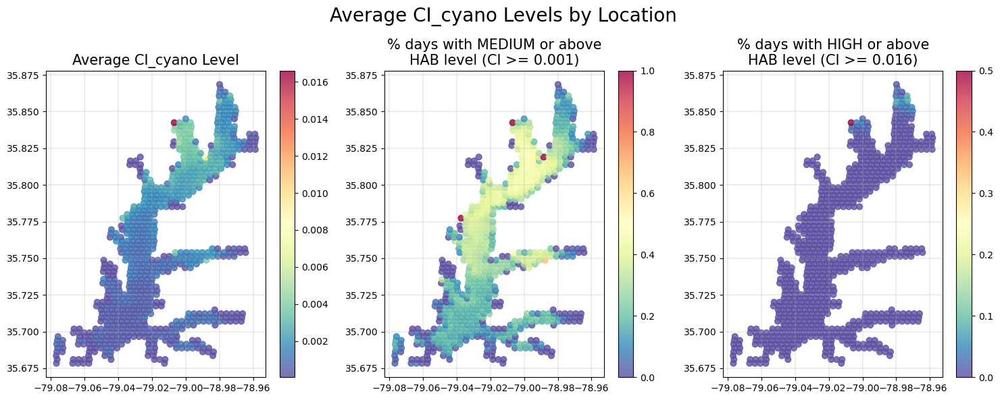

In [8]:
# aggreate data by lat/lon locations
df_loc = df.groupby(['clat','clon']).agg(CI_cyano=('CI_cyano','mean'),
                                             CI_cyano_median=('CI_cyano','median'),
                                             nobs=('date','count'),
                                             hab_high=('HAB_HIGH','sum'),
                                             hab_high_med=('HAB_HIGH_MED','sum')).reset_index()
df_loc['pct_hab_high'] = df_loc.hab_high/df_loc.nobs
df_loc['pct_hab_high_med'] = df_loc.hab_high_med/df_loc.nobs


fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(15, 6))

for v, ax, t in zip(['CI_cyano','pct_hab_high_med','pct_hab_high'],
                      [ax1, ax2, ax3],
                      ['Average CI_cyano Level', '% days with MEDIUM or above\nHAB level (CI >= 0.001)',
                      '% days with HIGH or above\nHAB level (CI >= 0.016)']):
    
    scat = ax.scatter(df_loc.clon, df_loc.clat, c=df_loc[v], cmap='Spectral_r', s=40, alpha=0.8)
    cbar = fig.colorbar(scat, ax=ax)
    ax.set_title(t, fontsize=15)
    ax.grid(linewidth=0.3, linestyle='-' )

plt.suptitle('Average CI_cyano Levels by Location', fontsize=20)
plt.tight_layout();

## Temporal Analysis: HAB by Time (Year & Month)

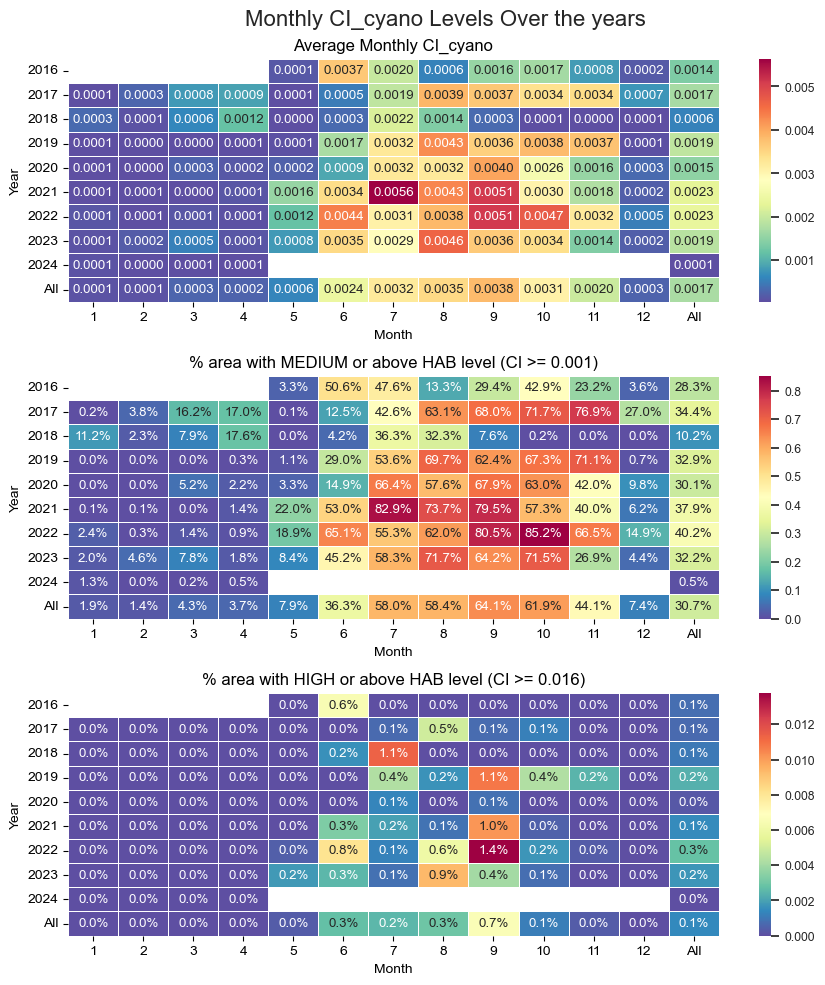

In [9]:
# plot data by month to reveal seasonality
df_daily['pct_hab_high'] = df_daily.hab_high/df_daily.nobs
df_daily['pct_hab_high_med'] = df_daily.hab_high_med/df_daily.nobs

fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(9, 10))
sns.set_theme(style='white')
sns.set(font_scale=0.8)
for v, ax, f, t in zip(['CI_cyano','pct_hab_high_med','pct_hab_high'],
                      [ax1, ax2, ax3],
                      [".4f", ".1%", ".1%"],
                      ['Average Monthly CI_cyano', '% area with MEDIUM or above HAB level (CI >= 0.001)',
                      '% area with HIGH or above HAB level (CI >= 0.016)']):
    
    pivot_ci = df_daily.pivot_table(index='year', columns='month', values=v, aggfunc='mean', margins=True)
    sns.heatmap(pivot_ci, ax=ax, annot=True, cmap='Spectral_r', fmt=f, linewidths=0.5) 
    ax.set_title(t, fontsize=12)
    ax.set_xlabel('Month', fontsize=10)
    ax.set_ylabel('Year', fontsize=10)
    
plt.suptitle('Monthly CI_cyano Levels Over the years', fontsize=16)
plt.tight_layout();

 ## Monthly CI Cyano change over time

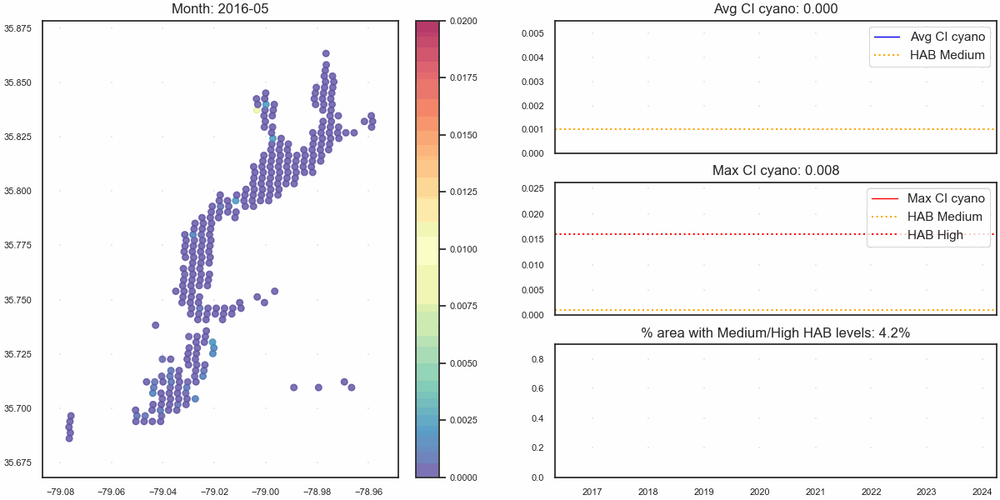

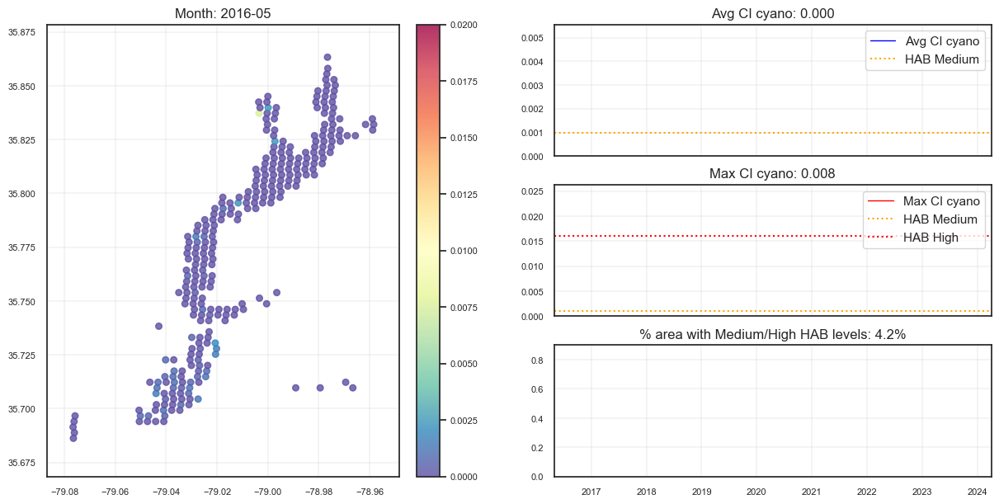

In [10]:
data = df.groupby(['clat','clon','Year','Month']).CI_cyano.mean().reset_index()
data['frame'] = (data.Year.astype('str')+'-'+data.Month.astype('str').apply(lambda x: x.zfill(2)))

data2 = df.groupby(['Year','Month']).agg(nobs = ('CI_cyano','count'), CI_cyano=('CI_cyano','mean'), CI_cyano_max=('CI_cyano','max'), HAB_HIGH_MED=('HAB_HIGH_MED','sum') ).reset_index()
data2['PCT_HAB_HIGH_MED'] = data2.HAB_HIGH_MED/data2.nobs
data2['day'] = 1
data2['date'] = pd.to_datetime(data2[['Year', 'Month', 'day']])
data2 = data2.set_index('date')[['CI_cyano','CI_cyano_max','PCT_HAB_HIGH_MED']]

yrange1 = [data.clat.min()-0.01, data.clat.max()+0.01]
xrange1 = [data.clon.min()-0.01, data.clon.max()+0.01]
xrange2 = [data2.index.values.min(), data2.index.values.max()]
yrange2_1 = [0, data2.CI_cyano.max()*1.05]
yrange2_2 = [0, data2.CI_cyano_max.max()*1.05]
yrange2_3 = [0, data2.PCT_HAB_HIGH_MED.max()*1.05]

frames = data.frame.sort_values().unique()

fig_w = 4
fig_h = int(round((yrange1[1]-yrange1[0])/(xrange1[1]-xrange1[0])*fig_w,0))

fig = plt.figure(layout='constrained', figsize=(fig_w*3, fig_h))
subfigs = fig.subfigures(1, 2, wspace=0.07, width_ratios=[1, 1])
sns.set_theme(style='white')
plt.rc('xtick', labelsize=8)
plt.rc('ytick', labelsize=8)

vmin = 0
vmax = 0.02

# Create the initial scatter plot with the specified colormap and color range
axsLeft = subfigs[0].subplots(1,1, sharey=True)
axsLeft.set_xlim(xrange1)
axsLeft.set_ylim(yrange1)
scat = axsLeft.scatter(data.clon, data.clat, c=data.CI_cyano, cmap='Spectral_r', s=30, alpha=0.8, vmin=vmin, vmax=vmax)
cbar = fig.colorbar(scat, ax=axsLeft)

# Create an initial empty line plot
axsRight = subfigs[1].subplots(3, 1, sharex=True)

line1, = axsRight[0].plot([], [], lw=1, color = 'blue', label='Avg CI cyano')
if yrange2_1[1] >= hab_med:
    axsRight[0].hlines(y=hab_med, xmin=data2.index[0], xmax=data2.index[-1], color='orange', linestyles='dotted', label='HAB Medium')
if yrange2_1[1] >= hab_high:
    axsRight[0].hlines(y=hab_high, xmin=data2.index[0], xmax=data2.index[-1], color='red', linestyles='dotted', label='HAB High')
axsRight[0].legend()

line2, = axsRight[1].plot([], [], lw=1, color = 'red', label='Max CI cyano')
if data2.CI_cyano_max.max() >= hab_med:
    axsRight[1].hlines(y=hab_med, xmin=data2.index[0], xmax=data2.index[-1], color='orange', linestyles='dotted', label='HAB Medium')
if data2.CI_cyano_max.max() >= hab_high:
    axsRight[1].hlines(y=hab_high, xmin=data2.index[0], xmax=data2.index[-1], color='red', linestyles='dotted', label='HAB High')
axsRight[1].legend()

line3, = axsRight[2].plot([], [], lw=1, color = 'red')

#ax2.set_xticks(np.arange(1,len(frames)+1))
axsRight[2].set_xlim(xrange2)
axsRight[0].set_ylim(yrange2_1)
axsRight[1].set_ylim(yrange2_2)
axsRight[2].set_ylim(yrange2_3)

def animate(i):
    axsLeft.clear()
    axsLeft.set_xlim(xrange1)
    axsLeft.set_ylim(yrange1)
    
    # Update the scatter plot with the same colormap and color range
    scat = axsLeft.scatter(data[data.frame == frames[i]].clon,
                       data[data.frame == frames[i]].clat,
                       c=data[data.frame == frames[i]].CI_cyano,
                       cmap='Spectral_r', vmin=vmin, vmax=vmax,
                       s=30, alpha=0.8)

    axsLeft.set_title(f'Month: {frames[i]}', fontsize=12)
    axsLeft.grid(linewidth=0.3, linestyle='-' )

    # Update the line plot with the line data for the current frame
    line1.set_data(data2.index.values[:i+1], data2.CI_cyano.values[:i+1])
    line2.set_data(data2.index.values[:i+1], data2.CI_cyano_max.values[:i+1])
    line3.set_data(data2.index.values[:i+1], data2.PCT_HAB_HIGH_MED.values[:i+1])

    axsRight[0].set_title(f'Avg CI cyano: {data2.CI_cyano.values[i]:.3f}', fontsize=12)
    axsRight[1].set_title(f'Max CI cyano: {data2.CI_cyano_max.values[i]:.3f}', fontsize=12)
    axsRight[2].set_title(f'% area with Medium/High HAB levels: {data2.PCT_HAB_HIGH_MED.values[i]:.1%}', fontsize=12)
    axsRight[0].grid(linewidth=0.3, linestyle='-' )
    axsRight[1].grid(linewidth=0.3, linestyle='-' )
    axsRight[2].grid(linewidth=0.3, linestyle='-' )

    return scat, line1, line2, line3

ani = animation.FuncAnimation(fig, animate, repeat=False, frames=len(frames), interval=1000)

#To save the animation using Pillow as a gif
writer = animation.PillowWriter(fps=1,
                                metadata=dict(artist='Me'),
                                bitrate=1000)

ani.save('scatter.gif', writer=writer)

with open('scatter.gif', 'rb') as f:
    display(Image(data=f.read(), format='png'))

In [11]:
# show animated plot as video
HTML(ani.to_html5_video())

## Impute missing weeks with mean

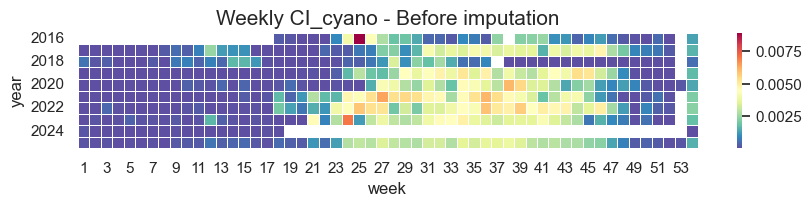

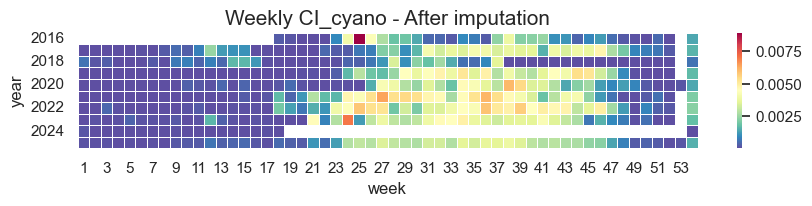

In [12]:
## impute missing week data
week_first = df_weekly[df_weekly.date==df_weekly.date.min()].week.values[0]
week_last = df_weekly[df_weekly.date==df_weekly.date.max()].week.values[0]
years = df_weekly.year.unique()

df_weekly_imp = df_weekly.copy()
append_rows = {'year':[], 'week':[], 'date':[]}

cicyano_mean = df_weekly.groupby('week').CI_cyano.mean().reset_index()

for w in range(1,53):
    if w < week_first:
        yy = years[1:]
    elif w > week_last:
        yy = years[:-1]
    else:
        yy = years
    tmpdf = df_weekly_imp[df_weekly_imp.week==w]
    y_avg = tmpdf.CI_cyano.mean()
    for y in yy:
        tmpdf2 = tmpdf[tmpdf.year==y]
        if len(tmpdf2)==0:
            append_rows['year'].append(y)
            append_rows['week'].append(w)
            append_rows['date'].append(datetime.datetime.strptime(str(y)+'-W'+str(w)+'-1', '%G-W%V-%u'))
            
df_append = pd.DataFrame(append_rows)
df_append['week'] = df_append['week'].astype('UInt32')
df_append = pd.merge_asof(left=df_append, right=cicyano_mean, on='week', direction='nearest')
df_weekly_imp = pd.concat([df_weekly_imp, df_append], axis=0, ignore_index=True)
df_weekly_imp = df_weekly_imp.sort_values(by='date').reset_index(drop=True)

sns.set_theme(style='white')
plt.figure(figsize=(10, 1.5))
pivot = pd.pivot_table(df_weekly, values='CI_cyano', index='year', columns='week', aggfunc='mean', margins=True)
sns.heatmap(pivot, annot=False, cmap='Spectral_r', linewidths=0.5)
plt.title('Weekly CI_cyano - Before imputation', fontsize=15)
plt.show()

plt.figure(figsize=(10, 1.5))
pivot = pd.pivot_table(df_weekly_imp,values='CI_cyano',index='year',columns='week',aggfunc='mean',margins=True)
sns.heatmap(pivot, annot=False, cmap='Spectral_r', linewidths=0.5)
plt.title('Weekly CI_cyano - After imputation', fontsize=15)
plt.show()

## Prepare data for SARIMA model

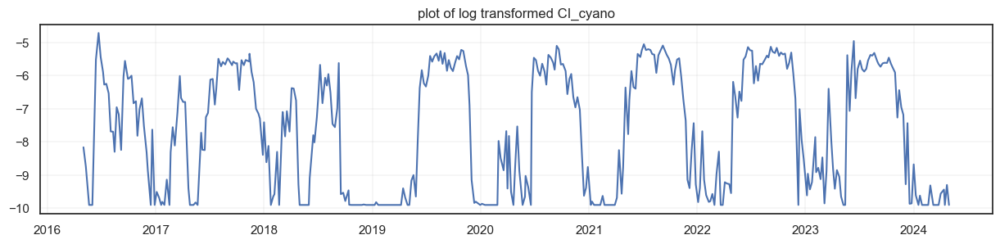

In [13]:
# log-transform CI_cyano values
fcdat = df_weekly_imp.copy()
fcdat['log_y'] = np.log(fcdat.CI_cyano)

plt.figure(figsize=(15, 3))
plt.plot(fcdat.date, fcdat.log_y)
plt.title('plot of log transformed CI_cyano')
plt.grid(linewidth=0.25);

In [14]:
# split data into train/test, use 10% data as test
test_size = int(len(fcdat) * 0.1)
train_test = ['train']*(len(fcdat)-test_size)+['test']*test_size
fcdat['train_test'] = train_test

dtrain = fcdat[fcdat['train_test']=='train'].copy()
dtest = fcdat[fcdat['train_test']=='test'].copy()
fcdat.shape, dtrain.shape, dtest.shape

((418, 7), (377, 7), (41, 7))

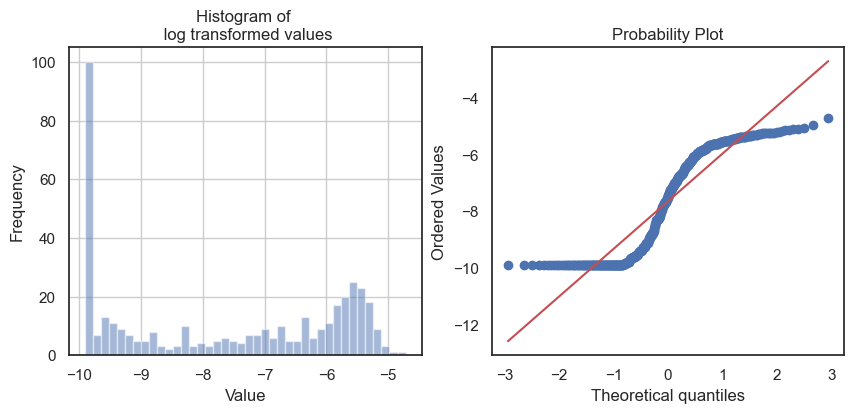

In [15]:
# quick check data distribution
def dist_ts(ts, lab = '', bins = 40):
    _,ax = plt.subplots(1,2,figsize=(10,4))
    ## Plot the histogram with labels
    ts.hist(ax = ax[0], bins = bins, alpha = 0.5);
    ax[0].set_xlabel('Value');
    ax[0].set_ylabel('Frequency');
    ax[0].set_title('Histogram of ' + lab);
    ## Plot the q-q plot on the other axes
    ss.probplot(ts, plot = ax[1]);

dist_ts(fcdat.log_y, lab = '\n log transformed values')

## Stationarity Test - ADF/KPSS

In [16]:
def test_stationarity(series, regression_model='c', rounding=3):
    """Function to test the stationarity of time series using:
    1. Augmented Dicky Fuller test using AIC 
    2. KPSS test for constant
    
    Arguments:  
        Series: the time series to be evaluated.   
        regression_model: model to be used:   
            'c' - model with a constant   
            'ct' - model wiht a constant and trend  
        rounding: the number of digits to display in printed output.   
    """
    if regression_model not in ['c','ct']:    
        print('Error!: argument regression model must be one of {\'c\',\'ct\'}')
        return
    with warnings.catch_warnings(): 
        warnings.filterwarnings("ignore")
        kpss_test = kpss(series, regression=regression_model)
        ADF_test = adfuller(series, regression=regression_model, autolag="AIC")
    return [round(ADF_test[0],rounding), round(ADF_test[4]['5%'],rounding), round(ADF_test[1],rounding),
                                       round(kpss_test[0],rounding), round(kpss_test[1],rounding)]
def stationary_tests(series, names, regression_model='c', rounding=3):
    test_columns = ['ADF_statistic','ADF_conf_int','ADF_p_value','KPSS_statistic','KPSS_p_value']
    out = pd.DataFrame(index=names, columns=test_columns)    
    for ser, name in zip(series,names):  
        out.loc[name,:] = test_stationarity(ser, regression_model=regression_model, rounding=rounding)
    return out

def auto_partial_corr_plot(ts, lags=40):
    _,ax = plt.subplots(2,1, figsize=(8,4))
    _=splt.plot_acf(ts, lags=lags, ax=ax[0])
    ax[0].grid(linewidth=0.5)
    _=splt.plot_pacf(ts, lags=lags, method='yw', ax=ax[1])
    ax[1].grid(linewidth=0.5)
    plt.tight_layout();

,ADF_statistic,ADF_conf_int,ADF_p_value,KPSS_statistic,KPSS_p_value
log transformed,-4.78,-2.869,0.0,0.07,0.1


ACF & PACF plots:


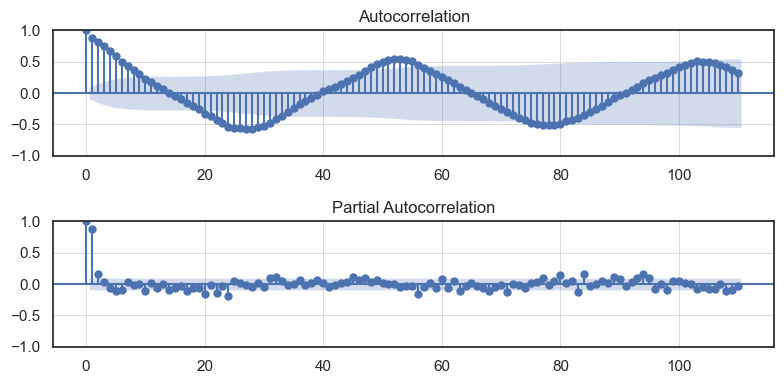

In [17]:
sns.set_theme(style='white')
display(stationary_tests([fcdat['log_y']], ['log transformed']))
print("ACF & PACF plots:")
auto_partial_corr_plot(fcdat['log_y'], lags=110)

## Seasonal Differencing

,ADF_statistic,ADF_conf_int,ADF_p_value,KPSS_statistic,KPSS_p_value
Seasonal diff of log y,-3.706,-2.87,0.004,0.11,0.1


ACF & PACF plots:


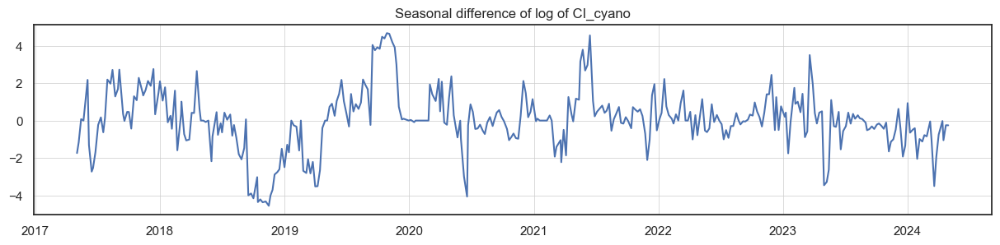

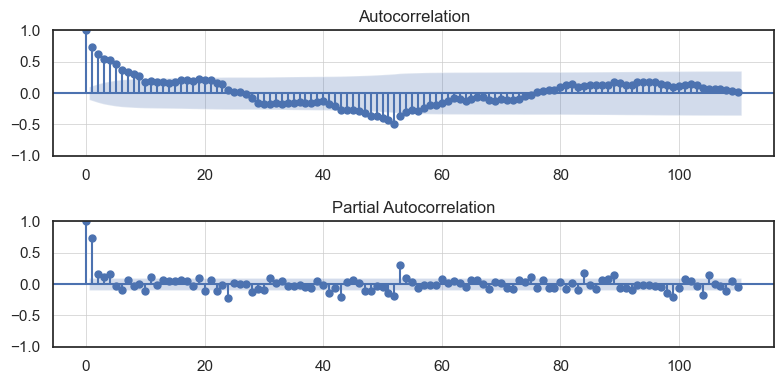

In [18]:
seasonal_diff = fcdat['log_y'].diff(52)
plt.figure(figsize=(15, 3))
plt.plot(fcdat.date, seasonal_diff)
plt.title('Seasonal difference of log of CI_cyano')
plt.grid(linewidth=0.5);

display(stationary_tests([seasonal_diff[52:]], ['Seasonal diff of log y']))
print("ACF & PACF plots:")
auto_partial_corr_plot(seasonal_diff[52:], lags=110)

## Seasonality Decomposition

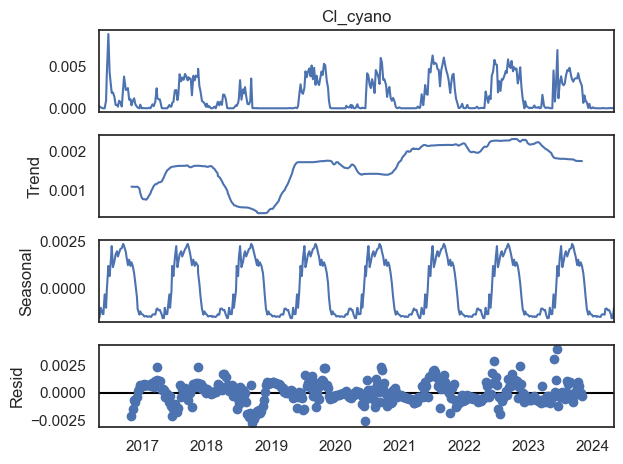

In [19]:
def decomp_ts(ts, period=52, model = 'additive'):
    res = sts.seasonal_decompose(ts, period = period, model = model) 
    res.plot()
    return(pd.DataFrame({'resid': res.resid, 
                         'trend': res.trend, 
                         'seasonal': res.seasonal},
                       index = ts.index) )

decomp = decomp_ts(fcdat.set_index('date').CI_cyano) 

       lb_stat     lb_pvalue
1   119.137089  9.773599e-28
2   188.865069  9.738035e-42
3   234.616962  1.388459e-50
4   258.896916  7.882936e-55
5   267.005113  1.230396e-55
6   270.125119  2.039606e-55
7   276.091306  7.654100e-56
8   278.471249  1.560368e-55
9   279.365857  6.162718e-55
10  279.384036  3.511777e-54
11  279.384258  1.909903e-53
12  280.844858  4.885898e-53
13  285.772995  2.266404e-53
14  293.085243  3.264565e-54
15  303.424610  1.085353e-55
16  317.037391  7.478625e-58
17  333.026532  1.651079e-60
18  344.876294  2.624910e-62
19  358.672118  1.643857e-64
20  375.684805  2.221586e-67
21  387.315813  3.887430e-69
22  401.477669  2.036372e-71
23  419.512573  1.693062e-74
24  444.223397  5.904702e-79
25  465.287106  1.166345e-82
26  479.338771  6.458482e-85
27  487.017811  7.353823e-86
28  493.032269  1.830367e-86
29  500.038528  2.826121e-87
30  502.778609  3.252653e-87
31  506.428589  2.408092e-87
32  507.427795  6.144292e-87
33  507.676335  2.198850e-86
34  508.417108

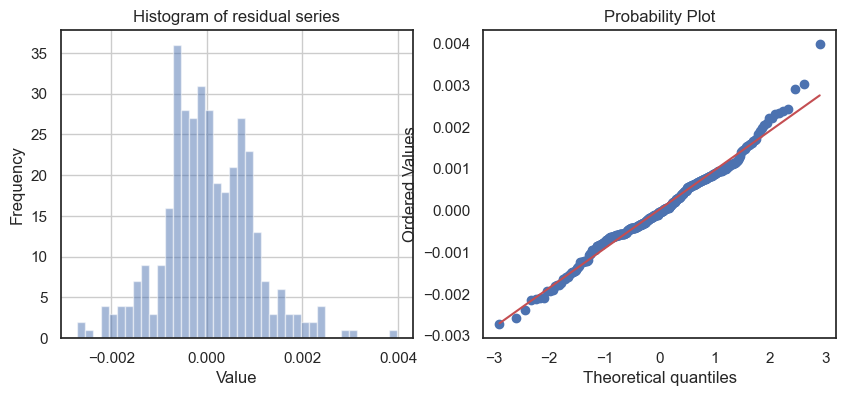

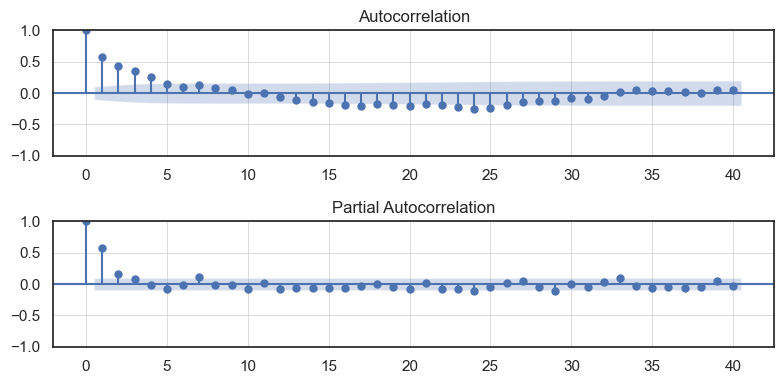

In [20]:
def evaluate_resids(residual_series, title='residual series', regression_model='c', ljungbox=True, ADF=True):
    dist_ts(residual_series, title) 
    auto_partial_corr_plot(residual_series)
    if(ljungbox==True): print(acorr_ljungbox(residual_series, lags=40, model_df=0))
    if(ADF==True): print(stationary_tests([residual_series], [title], regression_model=regression_model))
        
evaluate_resids(decomp[26:-26].resid)   

## Train SARIMA Model

In [21]:
# tune the hyperparameters of the SARIMA model
best_model = pm.auto_arima(dtrain.log_y, 
                             max_p=3, max_q=3, 
                             max_P=3, max_Q=3, 
                             m=52, seasonal=True,
                             d=0, D=1, trace=True,
                             information_criterion = 'bic',
                             error_action='ignore',  # don't want to know if an order does not work
                             suppress_warnings=True,  # don't want convergence warnings
                             stepwise=True)  # set to stepwise

a_order = best_model.get_params()['order']
s_order = best_model.get_params()['seasonal_order']
c_trend=None
if best_model.get_params()['with_intercept']:
    c_trend = 'c'

model_name = 'SARIMA'+str(a_order)+'x'+str(s_order)

Performing stepwise search to minimize bic
 ARIMA(2,0,2)(1,1,1)[52] intercept   : BIC=inf, Time=30.69 sec
 ARIMA(0,0,0)(0,1,0)[52] intercept   : BIC=1259.857, Time=0.25 sec
 ARIMA(1,0,0)(1,1,0)[52] intercept   : BIC=935.973, Time=5.41 sec
 ARIMA(0,0,1)(0,1,1)[52] intercept   : BIC=inf, Time=8.20 sec
 ARIMA(0,0,0)(0,1,0)[52]             : BIC=1255.147, Time=0.23 sec
 ARIMA(1,0,0)(0,1,0)[52] intercept   : BIC=1001.484, Time=0.86 sec
 ARIMA(1,0,0)(2,1,0)[52] intercept   : BIC=915.402, Time=16.99 sec
 ARIMA(1,0,0)(3,1,0)[52] intercept   : BIC=918.975, Time=37.79 sec
 ARIMA(1,0,0)(2,1,1)[52] intercept   : BIC=inf, Time=37.34 sec
 ARIMA(1,0,0)(1,1,1)[52] intercept   : BIC=inf, Time=10.00 sec
 ARIMA(1,0,0)(3,1,1)[52] intercept   : BIC=inf, Time=198.13 sec
 ARIMA(0,0,0)(2,1,0)[52] intercept   : BIC=1150.076, Time=11.20 sec
 ARIMA(2,0,0)(2,1,0)[52] intercept   : BIC=913.533, Time=20.70 sec
 ARIMA(2,0,0)(1,1,0)[52] intercept   : BIC=933.916, Time=6.58 sec
 ARIMA(2,0,0)(3,1,0)[52] intercept   : B

                                      SARIMAX Results                                      
Dep. Variable:                               log_y   No. Observations:                  377
Model:             SARIMAX(1, 0, 1)x(2, 1, [], 52)   Log Likelihood                -438.751
Date:                             Wed, 01 May 2024   AIC                            887.503
Time:                                     22:56:17   BIC                            906.422
Sample:                                          0   HQIC                           895.053
                                             - 377                                         
Covariance Type:                               opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.8436      0.043     19.788      0.000       0.760       0.927
ma.L1         -0.2541      

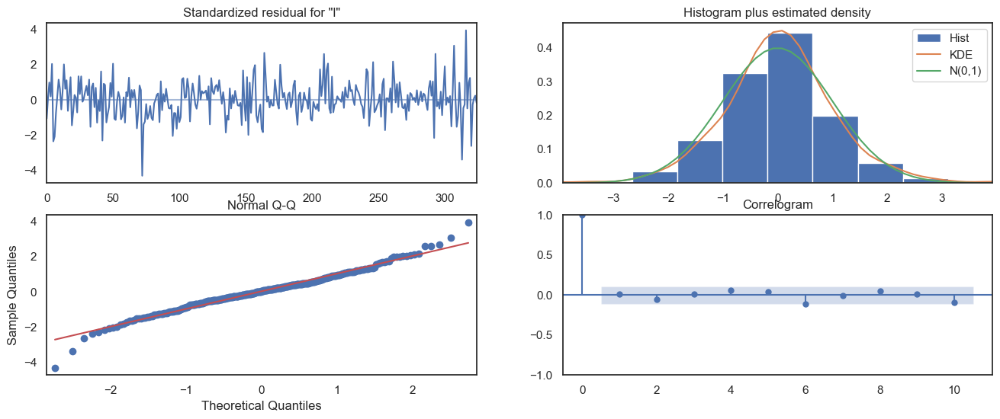

In [22]:
# train the SARIMA model with the optimized hyperparameters
smodel = SARIMAX(dtrain.log_y, order=a_order, seasonal_order=s_order, trend=c_trend).fit(disp=False)

print(smodel.summary())
smodel.plot_diagnostics(figsize=(16, 6))
plt.show();

                                      SARIMAX Results                                      
Dep. Variable:                               log_y   No. Observations:                  377
Model:             SARIMAX(1, 0, 1)x(2, 1, [], 52)   Log Likelihood                -438.751
Date:                             Wed, 01 May 2024   AIC                            887.503
Time:                                     22:56:18   BIC                            906.422
Sample:                                          0   HQIC                           895.053
                                             - 377                                         
Covariance Type:                               opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.8436      0.043     19.788      0.000       0.760       0.927
ma.L1         -0.2541      

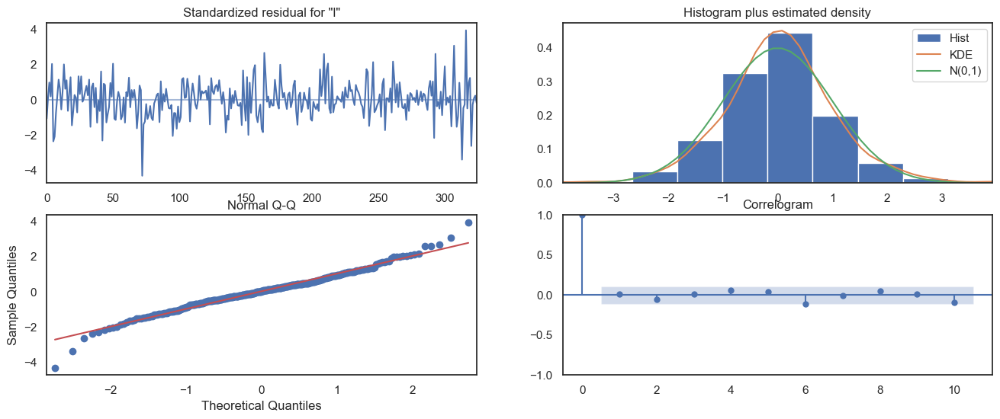

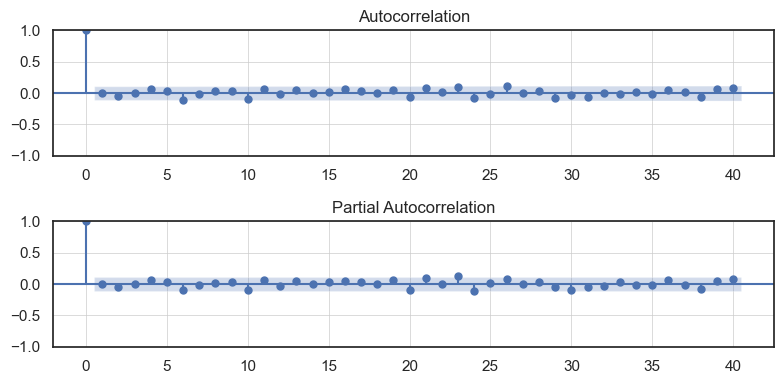

In [23]:
print(smodel.summary())
sns.set_theme(style='white')
smodel.plot_diagnostics(figsize=(16, 6))
sns.set_theme(style='white')
auto_partial_corr_plot(smodel.resid[53:])

      lb_stat  lb_pvalue
1    0.004428   0.946947
2    0.590976   0.744168
3    0.606161   0.895021
4    2.167259   0.705028
5    2.610390   0.759786
6    6.217369   0.399286
7    6.297769   0.505442
8    6.513703   0.589888
9    6.784422   0.659553
10  10.048387   0.436258
11  11.143226   0.431343
12  11.180479   0.513518
13  11.813264   0.543013
14  11.827841   0.620126
15  11.969265   0.681354
16  13.370231   0.645519
17  13.690438   0.688881
18  13.695456   0.748717
19  14.334414   0.763859
20  15.831386   0.727028
21  17.928983   0.653494
22  18.048655   0.703100
23  21.183916   0.569857
24  23.220245   0.506829
25  23.273148   0.561617
26  27.178179   0.400036
27  27.178737   0.454184
28  27.447988   0.493966
29  29.436883   0.442494
30  29.625515   0.484947
31  30.876784   0.472434
32  30.884534   0.522882
33  31.016274   0.566181
34  31.132968   0.608890
35  31.287500   0.648010
36  32.245041   0.647861
37  32.288013   0.689509
38  33.606710   0.672730
39  34.880490   0.658253


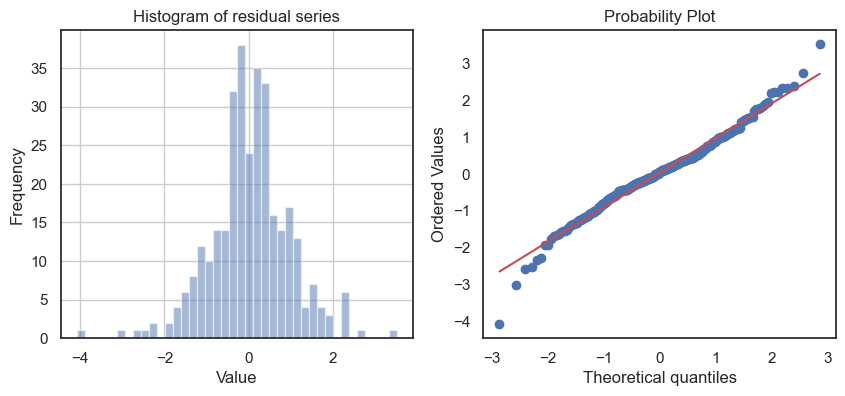

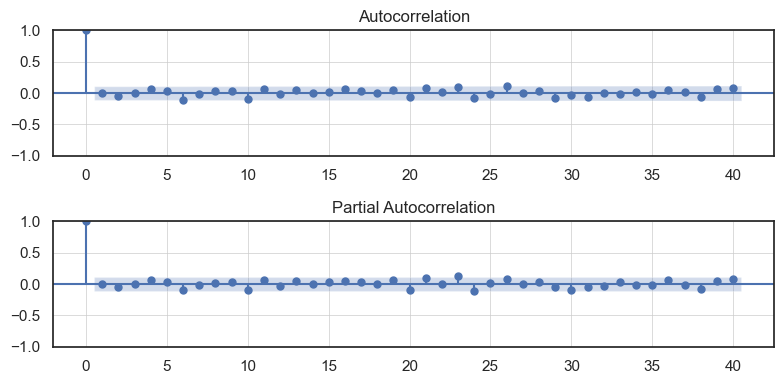

In [24]:
evaluate_resids(smodel.resid[53:]) 

## Forecast with SARIMA model 

In [25]:
# function to plot the forecasted data
def plot_fcst(mod):
    sfitted = mod.get_prediction(start=dtrain.index[0], end=dtrain.index[-1], dynamic=False).conf_int()
    sfitted = np.exp(sfitted)
    sfitted['log_yhat'] = mod.fittedvalues
    sfitted['yhat'] = np.exp(mod.fittedvalues)
    dfout = pd.concat([dtrain, sfitted], axis=1)
    dfout = dfout.rename(columns={'lower log_y':'yhat_lower', 'upper log_y':'yhat_upper'})
    dfout['train_test'] = 'train'

    sfcst = mod.get_forecast(test_size+10, dynamic=True).summary_frame()

    sfcst['date'] = [dtrain.date.max() + datetime.timedelta(days=7*(i+1)) for i in range(len(sfcst))]
    sfcst['yhat'] = np.exp(sfcst['mean'])
    sfcst['yhat_lower'] = np.exp(sfcst['mean_ci_lower'])
    sfcst['yhat_upper'] = np.exp(sfcst['mean_ci_upper'])
    sfcst = sfcst.rename(columns={"mean": "log_yhat"})

    dtestx = dtest.copy()
    dtestx = pd.merge_asof(left=dtestx, right=sfcst, on='date', direction='nearest')
    dtestx['train_test'] = 'test'
    dfout = pd.concat([dfout, dtestx], axis=0)
    
    #plt.figure(figsize=(10, 2))
    fig = plt.figure(figsize=(12, 2))
    ax = plt.subplot(111)
    ax.plot(dfout.date, dfout.CI_cyano, label='actual data')
    ax.plot(dfout.date[53:], dfout.yhat[53:], label='prediction')
    
    ax.fill_between(dfout.date[53:],
                     dfout.yhat_lower[53:],
                     dfout.yhat_upper[53:],
                     color = "orange", alpha=0.3,label='CI bound')
    
    if dfout.CI_cyano.max() >=hab_med or dfout.yhat[53:].max() >=hab_med:
        ax.hlines(y=hab_med, xmin=dfout.date.min(), xmax=dfout.date.max(), 
                   color='orange', linestyles='dotted', label='HAB Medium')
        
    if dfout.CI_cyano.max() >=hab_high or dfout.yhat[53:].max() >=hab_high:
        ax.hlines(y=hab_high, xmin=dfout.date.min(), xmax=dfout.date.max(), 
                   color='red', linestyles='dotted', label='HAB High')
        
    ax.axvline(x=dtest.date.min(),linestyle=':',color='k')
    ax.set_ylabel('CI_cyano', fontsize=12)
            
    box = ax.get_position()
    ax.set_position([box.x0, box.y0, box.width * 0.8, box.height])
    ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
    
    plt.title(model_name, fontsize=15)
    plt.grid(linewidth=0.3)
    plt.ylim(0, dfout.yhat[53:].max()*1.1);
    #plt.legend();
    
    return dfout

/opt/anaconda3/envs/capsproj/lib/python3.10/site-packages/pandas/core/internals/blocks.py:366: RuntimeWarning: overflow encountered in exp
  result = func(self.values, **kwargs)


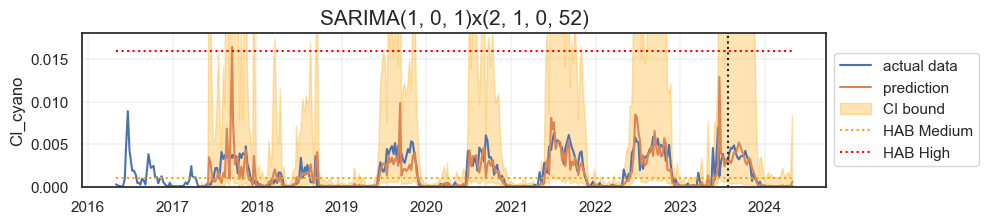

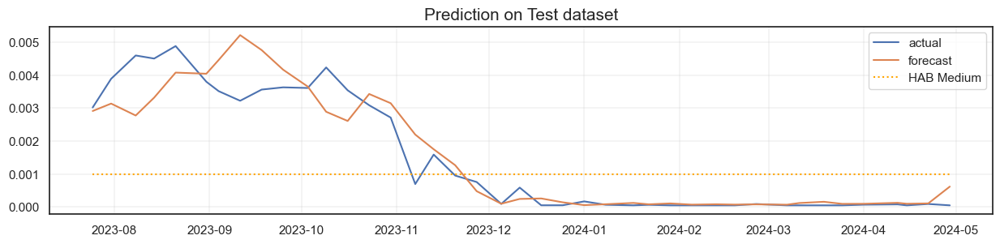

In [26]:
sns.set_theme(style='white')
# plot train and test fit
fcdat_out = plot_fcst(smodel)

# plot test results
plt.figure(figsize=(15, 3))
plt.plot(dtest.date, fcdat_out[fcdat_out.train_test=='test'].CI_cyano, label='actual')
plt.plot(dtest.date, fcdat_out[fcdat_out.train_test=='test'].yhat, label='forecast')

# plt.fill_between(dtest.date, fcdat_out[fcdat_out.train_test=='test'].yhat_lower,
#                      fcdat_out[fcdat_out.train_test=='test'].yhat_upper,
#                      color = "orange", alpha=0.3,label='forecast bound')

if dtest.CI_cyano.max() >=hab_high or fcdat_out[fcdat_out.train_test=='test'].yhat.max() >=hab_high:
    plt.hlines(y=hab_high, xmin=dtest.date.min(), xmax=dtest.date.max(), 
                color='red', linestyles='dotted', label='HAB High')
if dtest.CI_cyano.max() >=hab_med or fcdat_out[fcdat_out.train_test=='test'].yhat.max() >=hab_med:
    plt.hlines(y=hab_med, xmin=dtest.date.min(), xmax=dtest.date.max(), 
               color='orange', linestyles='dotted', label='HAB Medium')
plt.title('Prediction on Test dataset', fontsize=15)
plt.legend()
plt.grid(linewidth=0.3);

## Prediction Accuracy

In [27]:
# function to calculation prediction accuracy
def acc_metric(ytrue, ypred, hab_high=0.016, hab_med=0.001):
    
    ytrue_hab = np.where(ytrue >= hab_high, 'high', np.where(ytrue >= hab_med, 'med', 'low'))
    ypred_hab = np.where(ypred >= hab_high, 'high', np.where(ypred >= hab_med, 'med', 'low'))
        
    acc = np.mean(ytrue_hab==ypred_hab)
    level_perf = {}
    level_cnt, sum_pre, sum_rec = 0, 0, 0
    for l in ['low','med','high']:
        acc_l, pre_l, rec_l = None, None, None
        if np.sum(ytrue_hab==l)>0:
            level_cnt += 1
            acc_l = np.sum((ypred_hab==l)*(ytrue_hab==l))/np.sum(ytrue_hab==l)
            rec_l = np.sum((ypred_hab==l)*(ytrue_hab==l))/np.sum(ytrue_hab==l)
        if np.sum(ypred_hab==l)>0:
            pre_l = np.sum((ypred_hab==l)*(ytrue_hab==l))/np.sum(ypred_hab==l)            
        level_perf[l] = [acc_l, pre_l, rec_l]
        if pre_l: sum_pre += pre_l
        if rec_l: sum_rec += rec_l
    avg_pre = sum_pre/level_cnt
    avg_rec = sum_rec/level_cnt
    
    df = pd.DataFrame({'act':ytrue_hab, 'fcst':ypred_hab})
    df['obs']=1
    df_out = df.pivot_table(index='act',columns='fcst',values='obs',aggfunc='sum', margins=True)
        
    return {'Accuracy':acc, 
            'Acc-Low':level_perf['low'][0],
            'Acc-Med':level_perf['med'][0],
            'Acc-High':level_perf['high'][0],
            'Avg Precision': avg_pre,
            'Precision-Low':level_perf['low'][1],
            'Precision-Med':level_perf['med'][1],
            'Precision-High':level_perf['high'][1],
            'Avg Recall': avg_rec,
            'Recall-Low':level_perf['low'][2],
            'Recall-Med':level_perf['med'][2],
            'Recall-High':level_perf['high'][2]}, df_out

def sarima_accuracy(df, offset=53):
    df_train = df[df.train_test=='train'][offset:]
    df_test = df[df.train_test=='test']
    tr, mattr = acc_metric(df_train.CI_cyano.values, df_train.yhat.values)
    te, matte = acc_metric(df_test.CI_cyano.values, df_test.yhat.values)

    print('Accuracy Performance:')
    pd.options.display.float_format = '{:.1%}'.format
    pout = pd.DataFrame({'train':tr, 'test':te})
    display(pout[:4])
    display(pout[4:8])
    display(pout[8:])
    print('\nConfusion Matrix - Train:')
    display(mattr)
    print('\nConfusion Matrix - Test:')
    display(matte)
    return pout, mattr, matte


In [28]:
# assess model performance on accuracy, precision and recall:
perf_out, _, _ = sarima_accuracy(fcdat_out)

Accuracy Performance:


,train,test
Accuracy,89.2%,95.1%
Acc-Low,93.2%,92.0%
Acc-Med,84.4%,100.0%
Acc-High,NaN,NaN


,train,test
Avg Precision,89.7%,94.4%
Precision-Low,88.2%,100.0%
Precision-Med,91.2%,88.9%
Precision-High,0.0%,NaN


,train,test
Avg Recall,88.8%,96.0%
Recall-Low,93.2%,92.0%
Recall-Med,84.4%,100.0%
Recall-High,NaN,NaN



Confusion Matrix - Train:


fcst,high,low,med,All
act,,,,
low,NaN,16500.0%,1200.0%,177
med,100.0%,2200.0%,12400.0%,147
All,100.0%,18700.0%,13600.0%,324



Confusion Matrix - Test:


fcst,low,med,All
act,,,
low,2300.0%,200.0%,25
med,NaN,1600.0%,16
All,2300.0%,1800.0%,41


## Model "Rolling" Forecast

In [29]:
# forecast results for p weeks
def rolling_forecast(p, a_order, s_order, c_trend):
    fcst, fcst_low, fcst_high = [], [], []
    for t in range(test_size):
        dtrainx = fcdat[0+t:len(dtrain.index)+t]
        # re-train model
        newmod = SARIMAX(dtrainx.log_y, order=a_order, seasonal_order=s_order, trend=c_trend)
        newmod_fit = newmod.fit(disp=False)

        fcstx_results = newmod_fit.get_forecast(steps=p, dynamic=True)
        fcstx = fcstx_results.predicted_mean
        fcst_confintx = fcstx_results.conf_int()

        fcst.append(fcstx.values)
        fcst_low.append(fcst_confintx['lower log_y'].values)
        fcst_high.append(fcst_confintx['upper log_y'].values)
    
    return np.array(fcst), np.array(fcst_low), np.array(fcst_high)

Accuracy Performance:


,Accuracy,Acc-Low,Acc-Med,Acc-High,Avg Precision,Precision-Low,Precision-Med,Precision-High,Avg Recall,Recall-Low,Recall-Med,Recall-High
Rolling forecast,95.1%,96.0%,93.8%,None,94.9%,96.0%,93.8%,None,94.9%,96.0%,93.8%,None



Confusion Matrix - Test:


fcst,low,med,All
act,,,
low,24,1,25
med,1,15,16
All,25,16,41


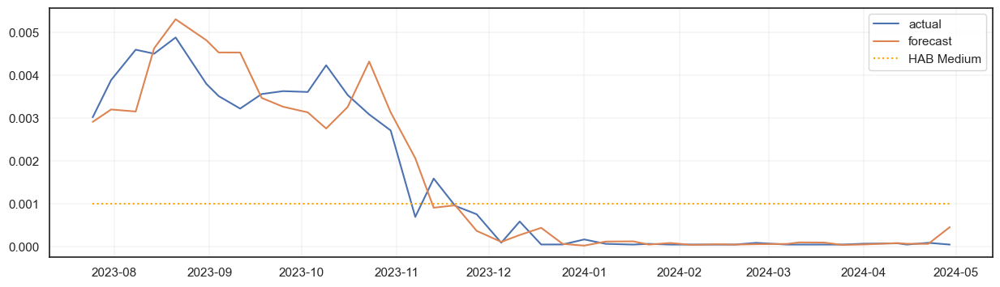

In [30]:
# prediction accuracy on 'rolling' forecast
dfcst, dlow, dhigh = rolling_forecast(p=10, a_order=a_order, s_order=s_order, c_trend=c_trend)

plt.figure(figsize=(15, 4))
plt.plot(dtest.date, dtest.CI_cyano, label='actual')
plt.plot(dtest.date, np.exp(dfcst[:,0]), label='forecast')

if dtest.CI_cyano.max() >=hab_high or np.exp(dfcst[:,0]).max()>=hab_high:
    plt.hlines(y=hab_high, xmin=dtest.date.min(), xmax=dtest.date.max(), 
                color='red', linestyles='dotted', label='HAB High')
if dtest.CI_cyano.max() >=hab_med or np.exp(dfcst[:,0]).max()>=hab_med:
    plt.hlines(y=hab_med, xmin=dtest.date.min(), xmax=dtest.date.max(), 
               color='orange', linestyles='dotted', label='HAB Medium')
    
plt.grid(linewidth=0.25)
plt.legend();

te, matte = acc_metric(dtest.CI_cyano.values, np.exp(dfcst[:,0]))

print('Accuracy Performance:')

display(pd.DataFrame(te, index=['Rolling forecast']))

print('\nConfusion Matrix - Test:')
display(matte)

In [31]:
# forcast window
p = 10
dtest_rolling = pd.DataFrame()
for t in range(test_size):
    tmpdf = fcdat[len(dtrain.index)+t:len(dtrain.index)+t+p]
    tmpdf = tmpdf.CI_cyano.reset_index(drop=True)
    missing = dtest_rolling.shape[0]-tmpdf.shape[0]
    if missing>0:
        tmpdf = pd.concat([tmpdf, pd.DataFrame([0]*missing)]).reset_index(drop=True)
                                         
    dtest_rolling = pd.concat([dtest_rolling, tmpdf], axis=1)
    
dtest_rolling = dtest_rolling.T
dtest_rolling.columns=['y_w'+str(i+1) for i in range(p)]
dtest_rolling.index = dtest.index


rolling_acc = pd.DataFrame()
for i in range(p):
    col = 'y_w'+str(i+1)
    n_fcst = (dtest_rolling['y_w'+str(i+1)]>0).sum()
    a, _ = acc_metric(dtest_rolling[dtest_rolling[col]>0][col].values, np.exp(dfcst[:n_fcst,i]))
    tmpdf = pd.DataFrame(a, index=["Week "+str(i+1)])
    rolling_acc = pd.concat([rolling_acc, tmpdf], axis=0)

print(f'Avg accuracy = {rolling_acc.Accuracy.mean():.2%}')
print(f'Avg accuracy (low) = {rolling_acc["Acc-Low"].mean():.2%}')
print(f'Avg accuracy (med) = {rolling_acc["Acc-Med"].mean():.2%}')
print(f'Avg accuracy (high) = {rolling_acc["Acc-High"].mean():.2%}')
rolling_acc

Avg accuracy = 94.74%
Avg accuracy (low) = 92.80%
Avg accuracy (med) = 99.38%
Avg accuracy (high) = nan%


,Accuracy,Acc-Low,Acc-Med,Acc-High,Avg Precision,Precision-Low,Precision-Med,Precision-High,Avg Recall,Recall-Low,Recall-Med,Recall-High
Week 1,95.1%,96.0%,93.8%,None,94.9%,96.0%,93.8%,None,94.9%,96.0%,93.8%,None
Week 2,97.5%,96.0%,100.0%,None,96.9%,100.0%,93.8%,None,98.0%,96.0%,100.0%,None
Week 3,94.9%,92.0%,100.0%,None,93.8%,100.0%,87.5%,None,96.0%,92.0%,100.0%,None
Week 4,94.7%,92.0%,100.0%,None,93.3%,100.0%,86.7%,None,96.0%,92.0%,100.0%,None
Week 5,94.6%,92.0%,100.0%,None,92.9%,100.0%,85.7%,None,96.0%,92.0%,100.0%,None
Week 6,94.4%,92.0%,100.0%,None,92.3%,100.0%,84.6%,None,96.0%,92.0%,100.0%,None
Week 7,94.3%,92.0%,100.0%,None,91.7%,100.0%,83.3%,None,96.0%,92.0%,100.0%,None
Week 8,94.1%,92.0%,100.0%,None,90.9%,100.0%,81.8%,None,96.0%,92.0%,100.0%,None
Week 9,93.9%,92.0%,100.0%,None,90.0%,100.0%,80.0%,None,96.0%,92.0%,100.0%,None
Week 10,93.8%,92.0%,100.0%,None,88.9%,100.0%,77.8%,None,96.0%,92.0%,100.0%,None


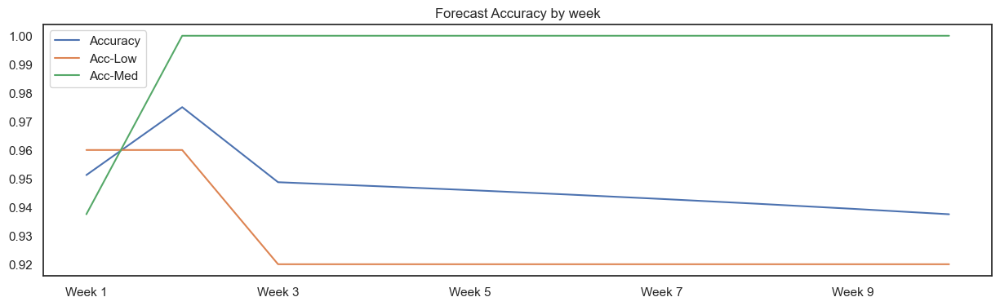

In [32]:
rolling_acc.Accuracy.plot(title="Forecast Accuracy by week", figsize=(15, 4))
rolling_acc['Acc-Low'].plot()
rolling_acc['Acc-Med'].plot()
plt.legend();

## Next 3 months Forecast

In [33]:
# train the SARIMA model with the optimized hyperparameters
model = SARIMAX(fcdat.log_y, order=a_order, seasonal_order=s_order, trend=c_trend).fit(disp=False)

# predict values for next 3 months
pred3m = model.get_forecast(12, dynamic=True).summary_frame()

pred3m['date'] = [fcdat.date.max() + datetime.timedelta(days=7*(i+1)) for i in range(len(pred3m))]
pred3m['Predicted CI_cyano'] = np.exp(pred3m['mean'])
pred3m['yhat_lower'] = np.exp(pred3m['mean_ci_lower'])
pred3m['yhat_upper'] = np.exp(pred3m['mean_ci_upper'])
pred3m = pred3m.rename(columns={"mean": "log_yhat"})
pred3m['HAB Level'] = np.where(pred3m['Predicted CI_cyano'].values >= hab_high,'High',
                         np.where(pred3m['Predicted CI_cyano'].values >= hab_med, 'Medium', 'Low'))

In [34]:
pd.options.display.float_format = '{:.6f}'.format
pred3m[['date','Predicted CI_cyano','HAB Level']]

log_y,date,Predicted CI_cyano,HAB Level
418,2024-05-06,0.000065,Low
419,2024-05-13,0.000094,Low
420,2024-05-20,0.000997,Low
421,2024-05-27,0.000495,Low
422,2024-06-03,0.001246,Medium
423,2024-06-10,0.002849,Medium
424,2024-06-17,0.001764,Medium
425,2024-06-24,0.002748,Medium
426,2024-07-01,0.003413,Medium
427,2024-07-08,0.002320,Medium


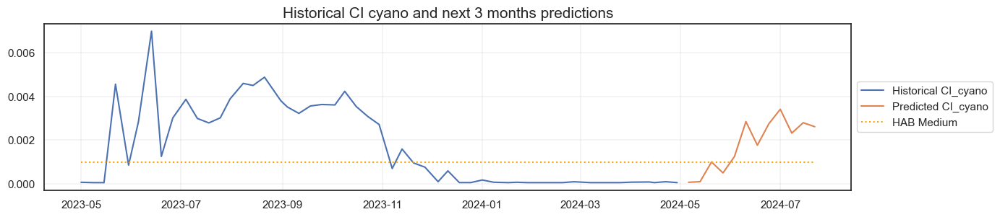

In [35]:
# plot test results
plt.figure(figsize=(18, 3))
ax = plt.subplot(111)
ax.plot(fcdat.date[-53:], fcdat.CI_cyano[-53:], label='Historical CI_cyano')
ax.plot(pred3m.date, pred3m['Predicted CI_cyano'], label='Predicted CI_cyano')

# ax.fill_between(pred3m.date, pred3m.yhat_lower,pred3m.yhat_upper,
#                 color = "orange", alpha=0.3,label='CI bound')

ax.hlines(y=hab_med, xmin=fcdat.date[-53:].min(), xmax=pred3m.date.max(), 
                color='orange', linestyles='dotted', label='HAB Medium')
ax.set_title('Historical CI cyano and next 3 months predictions', fontsize=15)

box = ax.get_position()
ax.set_position([box.x0, box.y0, box.width * 0.8, box.height])
ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
    
plt.grid(linewidth=0.3);